In [1]:
#!/usr/bin/env python3
import os
import re
import sys
print(sys.executable)
print(sys.path)
print(sys.version)

import collections
import argparse
import tables
import itertools
import matplotlib
import glob
import math
%matplotlib inline

import scipy.io
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import pandas as pd
import scipy
import scipy.stats as stats
import scipy.sparse as sp_sparse
import scanpy as sc 
import scanpy.external as sce

from collections import defaultdict
from scipy import sparse, io

import scanpy.external as sce
import matplotlib

from scipy.sparse import csr_matrix
from multiprocessing import Pool
#from matplotlib_venn import venn2, venn2_circles
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

print('numpy', np.__version__)
print('pandas', pd.__version__)
print('scipy', scipy.__version__)
print('matplotlib', matplotlib.__version__)

!date +%F

/home2/s426305/.conda/envs/py36/bin/python
['', '/cm/shared/apps/cnvkit/0.9.5/lib/python3.6/site-packages', '/cm/shared/apps/python/3.6.4-anaconda/lib', '/cm/shared/apps/jupyterkernel-matlab/0.16.1/lib/python3.6/site-packages', '/home2/s426305/.conda/envs/py36/lib/python36.zip', '/home2/s426305/.conda/envs/py36/lib/python3.6', '/home2/s426305/.conda/envs/py36/lib/python3.6/lib-dynload', '/home2/s426305/.local/lib/python3.6/site-packages', '/home2/s426305/.conda/envs/py36/lib/python3.6/site-packages', '/home2/s426305/.conda/envs/py36/lib/python3.6/site-packages/IPython/extensions', '/home2/s426305/.ipython']
3.6.7 | packaged by conda-forge | (default, Jul  2 2019, 02:18:42) 
[GCC 7.3.0]
numpy 1.16.1
pandas 0.25.1
scipy 1.1.0
matplotlib 3.3.3
2021-10-12


## Load data
____

In [2]:
DATA_DIR = '../Data/'
Clone_dict = {}
Clone_dict_file = DATA_DIR + 'YWsg1P1-clone_tree.0.05.txt'
with open(Clone_dict_file) as f:
    first_line = f.readline()
    word = '}'
    for line in f:
        if not word in line:
            ID, clones = line.split(":")
            clone_IDs = clones.replace("'[", "").replace("]',", "").replace("'", "").strip(' \n')
            individual_clone_ID = clone_IDs.split(', ')
            Clone_dict.update({ID.strip("'") : individual_clone_ID})

In [3]:
plot_clone_list = []
for i in Clone_dict.keys():
    if len(set(Clone_dict[i])) > 100:
        plot_clone_list.append(i)

In [4]:
length_list = [0, 248956422, 491149951, 689445510, 879660065, 1061198324,
               1232004303, 1391350276, 1536488912, 1674883629, 1808681051,
               1943767673, 2077042982, 2191407310, 2298451028, 2400442217,
               2490780562, 2574038003, 2654411288, 2713028904, 2777473071,
               2824183054, 2875001522, 3031042417]

chr_order = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
             '12', '13', '14', '15', '16', '17', '18', '19', '20',
             '21', '22', 'X', 'Y']

v2_FILE = '../Data/plot_annotation.txt'

annot_df = pd.read_csv(v2_FILE,
        header = None,
        sep='\t',
        names = ['idx', 'gene_names', 'chromosome', 'pos', 'strand', 'color_idx', 'chr_idx'])

In [5]:
sub_df = pd.read_pickle('./Singlet_sub_df.pkl') #file deposits in GEO 

## Filter expressed genes 
___

In [6]:
gene_num, cell_num = sub_df.shape

In [7]:
nonzero_idx = np.where(np.sum(sub_df > 0, axis=1) > (cell_num * 0.1))[0]

In [8]:
All_idx = [i for i in sorted(set(nonzero_idx) & set(annot_df.idx))]

In [9]:
len(All_idx)

8282

## Select clonal cells 
___

In [10]:
All_clone_cells = []
for i in plot_clone_list:
    for k in Clone_dict[i]:
        All_clone_cells.append(k)

In [11]:
len(All_clone_cells)

10944

In [11]:
# remove high mitochondira gene cells
high_mito_cluster_cells = []
with open(DATA_DIR + 'high_mito_cluster.txt') as f:
    for line in f: 
        line = line.strip()
        high_mito_cluster_cells.append(line)

In [12]:
#Non-clone cells
Non_clone_cells = []
for i in Clone_dict.keys():
    if len(Clone_dict[i]) < 2:
        Non_clone_cells.append(i)

In [13]:
Normal_non_clone_cells = list(set(Non_clone_cells) - (set(Non_clone_cells).intersection(set(high_mito_cluster_cells))))

In [14]:
minor_clone_list = []
for i in Clone_dict.keys():
    if 1 < len(set(Clone_dict[i])) < 100:
        minor_clone_list.append(i)

In [15]:
Minor_clone = []
for i in minor_clone_list:
    for k in Clone_dict[i]:
        Minor_clone.append(k)

## Normalization
___

In [16]:
cpm_matrix = np.array(sub_df[All_clone_cells + Normal_non_clone_cells + Minor_clone] / sub_df[All_clone_cells + Normal_non_clone_cells + Minor_clone].sum(axis = 0) * 1000000)

In [17]:
cpm_matrix.shape

(58381, 54370)

## Calculate z score
_____

In [18]:
sub_df.shape

(58381, 54798)

In [19]:
zscore_all = stats.zscore(cpm_matrix[All_idx], axis=1, ddof=1)

## heatmap
____

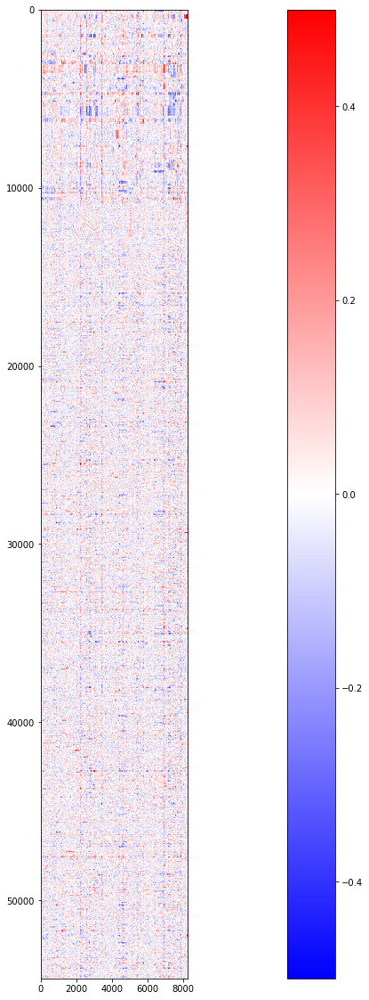

In [20]:
fig, ax = plt.subplots(figsize= (40, 20))

plt.imshow(zscore_all.T, cmap='bwr', vmin=-0.5, vmax=0.5)
plt.colorbar()

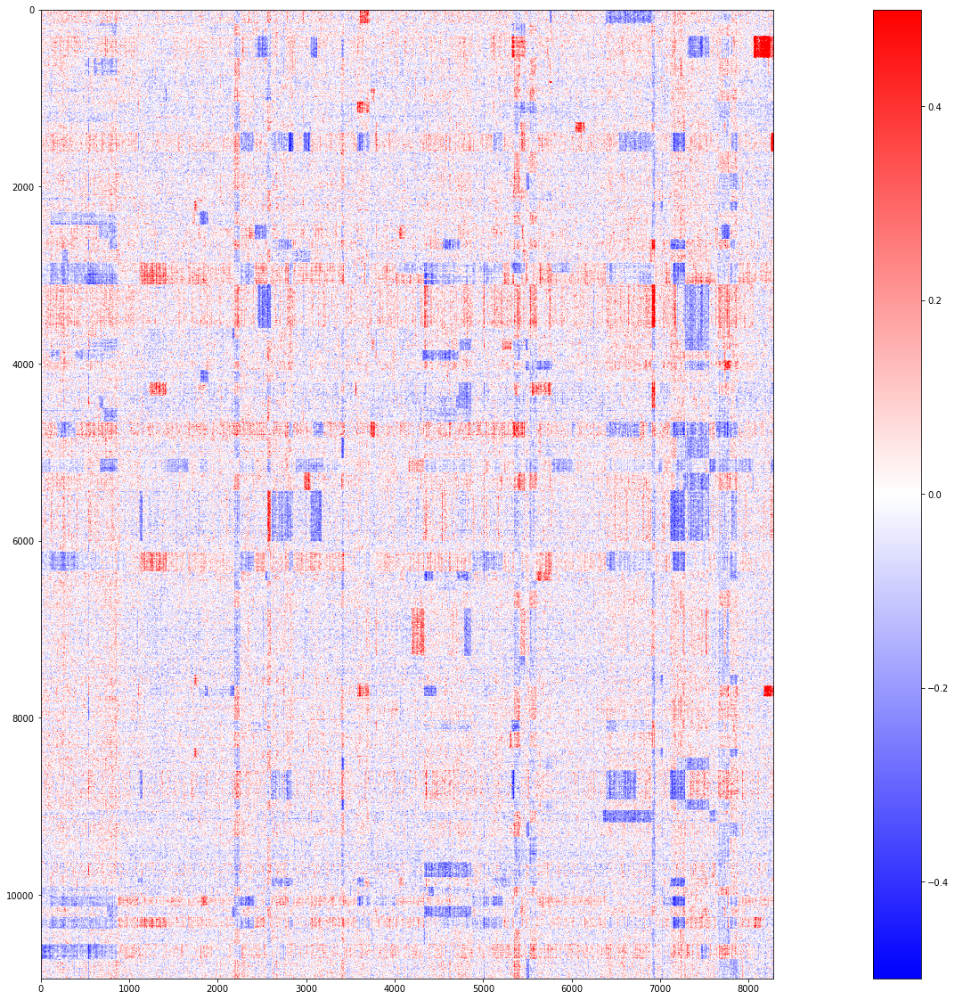

In [21]:
#Enlarge for all the major clones
fig, ax = plt.subplots(figsize= (40, 20))

plt.imshow(zscore_all.T[0:len(All_clone_cells)], cmap='bwr', vmin=-0.5, vmax=0.5)
plt.colorbar()
#plt.savefig('../Plots/10%expr_all_genes-All_clones_heatmap.pdf)

## Clone size
____

In [22]:
Clone_size = []
for i in plot_clone_list:
    Clone_size.append(len(Clone_dict[i]))

In [23]:
start_pos = list(np.cumsum(Clone_size))
start_pos.insert(0,0)
del start_pos[-1]
end_pos = list(np.cumsum(Clone_size))

In [24]:
#average z score for each gene depending on the clones
Ave_zscore = []
for i, j in zip(start_pos, end_pos):
    ave_zscore = np.mean(zscore_all.T[i:j], axis=0)
    Ave_zscore.append(ave_zscore)

In [25]:
Non_clonal_ave_zscore = np.mean(zscore_all.T[len(All_clone_cells):len(All_clone_cells)+len(Normal_non_clone_cells)], axis=0)

## Plot z score trance of two selected clones
____

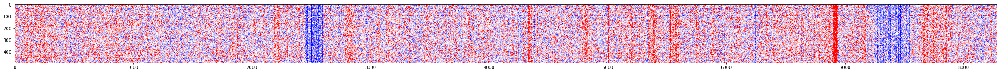

In [26]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize= (40, 20))
clone = 20
plt.imshow(zscore_all.T[start_pos[clone]:end_pos[clone]], cmap='bwr', vmin=-0.5, vmax=0.5)
#plt.colorbar()

In [27]:
Clone_size[20]

491

## Loess: local linear regression, smoother the line
______
#### Reference: https://github.com/joaofig/pyloess/blob/master/pyloess/Loess.py

In [28]:
import numpy as np
import time
import math


def tricubic(x):
    y = np.zeros_like(x)
    idx = (x >= -1) & (x <= 1)
    y[idx] = np.power(1.0 - np.power(np.abs(x[idx]), 3), 3)
    return y


class Loess(object):

    @staticmethod
    def normalize_array(array):
        min_val = np.min(array)
        max_val = np.max(array)
        return (array - min_val) / (max_val - min_val), min_val, max_val

    def __init__(self, xx, yy, degree=1):
        self.n_xx, self.min_xx, self.max_xx = self.normalize_array(xx)
        self.n_yy, self.min_yy, self.max_yy = self.normalize_array(yy)
        self.degree = degree

    @staticmethod
    def get_min_range(distances, window):
        min_idx = np.argmin(distances)
        n = len(distances)
        if min_idx == 0:
            return np.arange(0, window)
        if min_idx == n-1:
            return np.arange(n - window, n)

        min_range = [min_idx]
        while len(min_range) < window:
            i0 = min_range[0]
            i1 = min_range[-1]
            if i0 == 0:
                min_range.append(i1 + 1)
            elif i1 == n-1:
                min_range.insert(0, i0 - 1)
            elif distances[i0-1] < distances[i1+1]:
                min_range.insert(0, i0 - 1)
            else:
                min_range.append(i1 + 1)
        return np.array(min_range)

    @staticmethod
    def get_weights(distances, min_range):
        max_distance = np.max(distances[min_range])
        weights = tricubic(distances[min_range] / max_distance)
        return weights

    def normalize_x(self, value):
        return (value - self.min_xx) / (self.max_xx - self.min_xx)

    def denormalize_y(self, value):
        return value * (self.max_yy - self.min_yy) + self.min_yy

    def estimate(self, x, window, use_matrix=False, degree=1):
        n_x = self.normalize_x(x)
        distances = np.abs(self.n_xx - n_x)
        min_range = self.get_min_range(distances, window)
        weights = self.get_weights(distances, min_range)

        if use_matrix or degree > 1:
            wm = np.multiply(np.eye(window), weights)
            xm = np.ones((window, degree + 1))

            xp = np.array([[math.pow(n_x, p)] for p in range(degree + 1)])
            for i in range(1, degree + 1):
                xm[:, i] = np.power(self.n_xx[min_range], i)

            ym = self.n_yy[min_range]
            xmt_wm = np.transpose(xm) @ wm
            beta = np.linalg.pinv(xmt_wm @ xm) @ xmt_wm @ ym
            y = (beta @ xp)[0]
        else:
            xx = self.n_xx[min_range]
            yy = self.n_yy[min_range]
            sum_weight = np.sum(weights)
            sum_weight_x = np.dot(xx, weights)
            sum_weight_y = np.dot(yy, weights)
            sum_weight_x2 = np.dot(np.multiply(xx, xx), weights)
            sum_weight_xy = np.dot(np.multiply(xx, yy), weights)

            mean_x = sum_weight_x / sum_weight
            mean_y = sum_weight_y / sum_weight

            b = (sum_weight_xy - mean_x * mean_y * sum_weight) / \
                (sum_weight_x2 - mean_x * mean_x * sum_weight)
            a = mean_y - b * mean_x
            y = a + b * n_x
        return self.denormalize_y(y)

In [29]:
clone1 = 2
clone2 = 49
xx = np.arange(len(All_idx))
yy = Ave_zscore[clone1]

loess = Loess(xx, yy)

x_axis = []
y_axis = []
for x in xx:
    y = loess.estimate(x, window=20, use_matrix=False, degree=1)
    x_axis.append(x)
    y_axis.append(y)
    
xx_2 = np.arange(len(All_idx))
yy_2 = Ave_zscore[clone2]

loess = Loess(xx_2, yy_2)

x_axis_2 = []
y_axis_2 = []
for x in xx_2:
    y = loess.estimate(x, window=20, use_matrix=False, degree=1)
    x_axis_2.append(x)
    y_axis_2.append(y)

In [30]:
xx_3 = np.arange(len(All_idx))
yy_3 = Non_clonal_ave_zscore

loess = Loess(xx_3, yy_3)

x_axis_3 = []
y_axis_3 = []
for x in xx_3:
    y = loess.estimate(x, window=20, use_matrix=False, degree=1)
    x_axis_3.append(x)
    y_axis_3.append(y)

Text(0.5, 1.0, 'z score average trace')

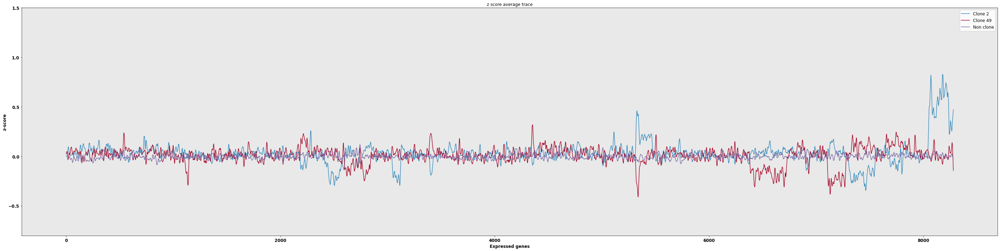

In [31]:
fig, ax = plt.subplots(figsize=(50,12))
ax.set_facecolor('#E9E9E9')
ax.set_xlabel('Expressed genes', fontsize=12, fontweight='bold')
ax.set_ylabel('z-score', fontsize=12, fontweight='bold')
ax.set_ylim(-0.8,1.5)
#ax.set_xlim(-10,len(All_idx)+10)

'''
ax = plt.plot(np.arange(len(All_idx)), 
             np.zeros(len(All_idx)), 
             color='#A60628')
'''

ax = plt.plot(x_axis, 
             y_axis,
             color='#348ABD',
             alpha=1,
             label='Clone 2') #change label!

ax = plt.plot(x_axis_2, 
             y_axis_2,
             color='#A60628', 
             alpha=1,
             label='Clone 49') #change label!

ax = plt.plot(x_axis_3, 
             y_axis_3,
             color='#7A68A6', 
             alpha=1,
             label='Non clone')

plt.legend(prop={'size':12})
plt.xticks(size = 12, fontweight= 'bold')
plt.yticks(size = 12, fontweight= 'bold')
plt.title("z score average trace", fontsize=12)
#plt.savefig('./zscore_trace_line-loess.pdf')

In [32]:
oncogene = ['ERBB2', 'AKT1S1', 'CCNE1', 'PIK3CA', 'MYC', 'MYCL', 'MYCN', 'EGFR', 'PIK3R1', 'YAP1', 'IGF1R', 'SYK', 'ZAP70'] 
tumor_suppressor = ['TP53', 'BRCA1', 'NF1', 'MAP2K4', 'PTEN', 'ARID1A', 'RB1', 'CDKN2A', 'APC', 'CADM1', 'MSH2']

Processing: clone 0
Processing: clone 1
Processing: clone 2
Processing: clone 3
Processing: clone 4
Processing: clone 5
Processing: clone 6
Processing: clone 7
Processing: clone 8
Processing: clone 9
Processing: clone 10
Processing: clone 11
Processing: clone 12
Processing: clone 13
Processing: clone 14
Processing: clone 15
Processing: clone 16
Processing: clone 17
Processing: clone 18
Processing: clone 19
Processing: clone 20


/home2/s426305/.conda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Processing: clone 21
Processing: clone 22
Processing: clone 23
Processing: clone 24
Processing: clone 25
Processing: clone 26
Processing: clone 27
Processing: clone 28
Processing: clone 29
Processing: clone 30
Processing: clone 31
Processing: clone 32
Processing: clone 33
Processing: clone 34
Processing: clone 35
Processing: clone 36
Processing: clone 37
Processing: clone 38
Processing: clone 39
Processing: clone 40
Processing: clone 41
Processing: clone 42
Processing: clone 43
Processing: clone 44
Processing: clone 45
Processing: clone 46
Processing: clone 47
Processing: clone 48
Processing: clone 49
Processing: clone 50
Processing: clone 51
Processing: clone 52
Processing: clone 53
Processing: clone 54
Processing: clone 55
Processing: clone 56
Processing: clone 57
Processing: clone 58
Processing: clone 59
Processing: clone 60
Processing: clone 61
Processing: clone 62


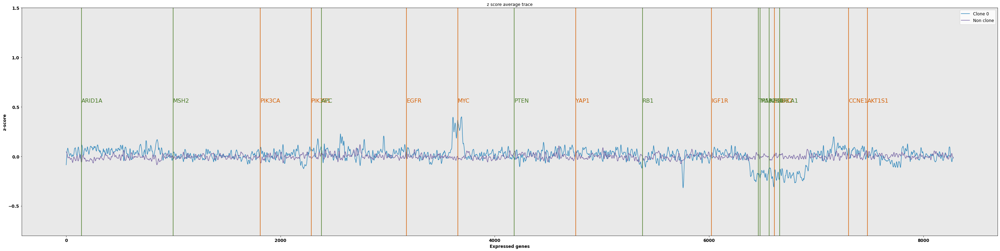

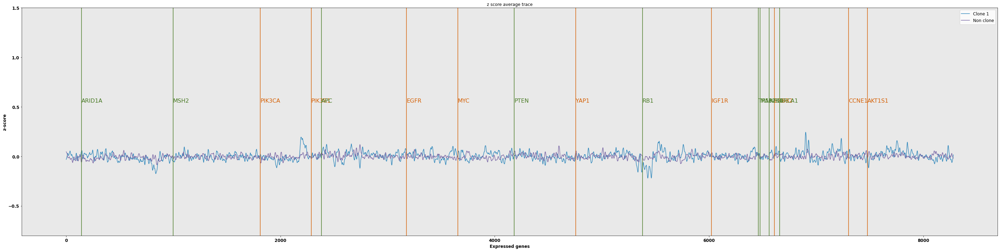

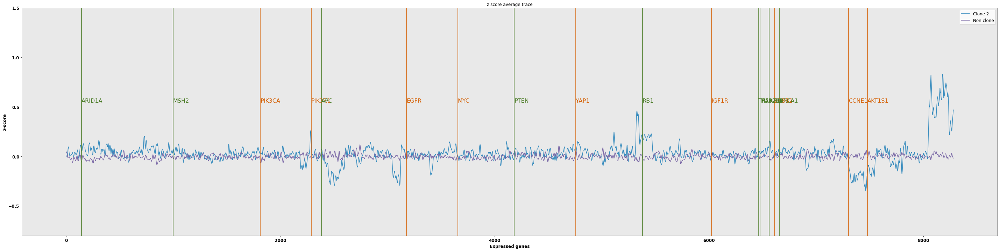

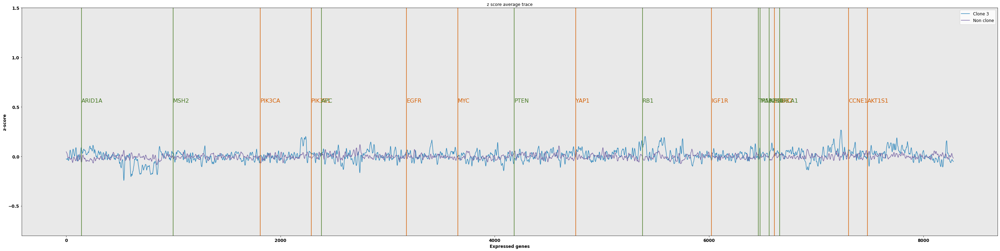

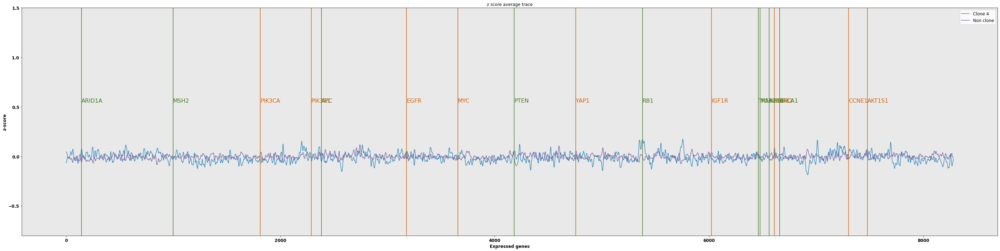

...

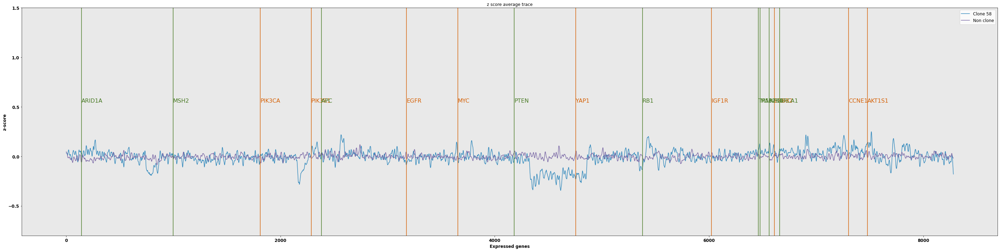

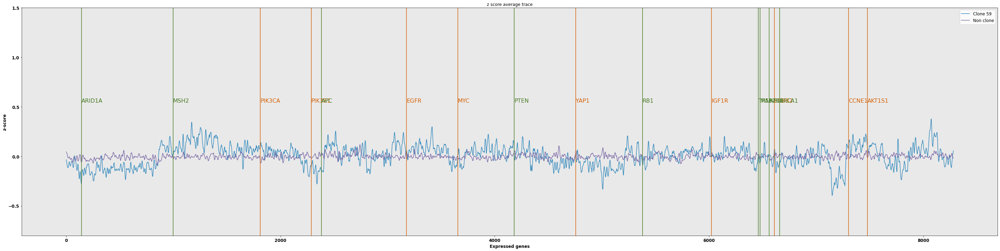

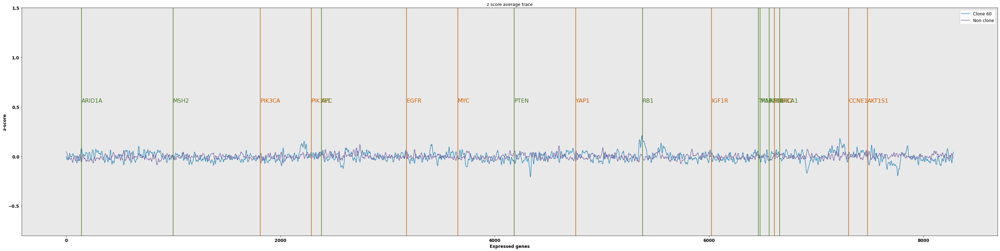

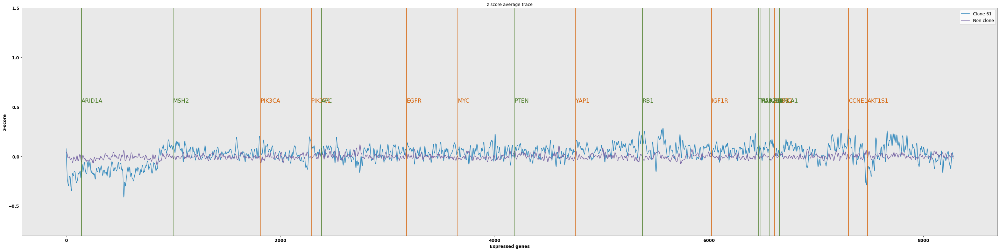

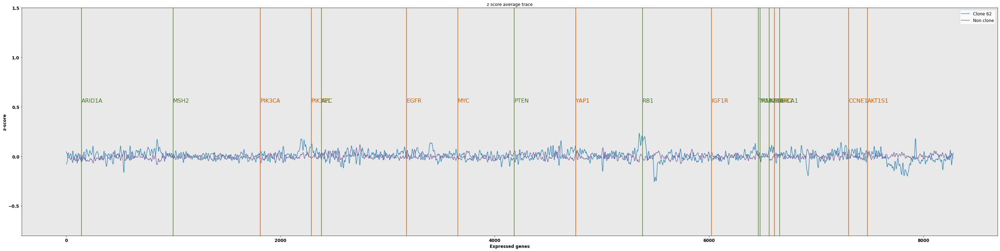

In [33]:
#Pick one example clone 
for clone in np.arange(len(plot_clone_list)):
    print('Processing: clone ' + str(clone))
    xx = np.arange(len(All_idx))
    yy = Ave_zscore[clone]

    loess = Loess(xx, yy)

    x_axis = []
    y_axis = []
    for x in xx:
        y = loess.estimate(x, window=20, use_matrix=False, degree=1)
        x_axis.append(x)
        y_axis.append(y)

    #Non clone average
    xx_3 = np.arange(len(All_idx))
    yy_3 = Non_clonal_ave_zscore

    loess = Loess(xx_3, yy_3)

    x_axis_3 = []
    y_axis_3 = []
    for x in xx_3:
        y = loess.estimate(x, window=20, use_matrix=False, degree=1)
        x_axis_3.append(x)
        y_axis_3.append(y)


    #Plot clone z score trace 
    fig, ax = plt.subplots(figsize=(50,12))
    ax.set_facecolor('#E9E9E9')
    ax.set_xlabel('Expressed genes', fontsize=12, fontweight='bold')
    ax.set_ylabel('z-score', fontsize=12, fontweight='bold')
    ax.set_ylim(-0.8,1.5)
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    x_offset = (xmax - xmin) * 0.1
    y_offset = (ymax - ymin) * 0.02

    ax = plt.plot(x_axis, 
                 y_axis,
                 color='#348ABD',
                 alpha=1,
                 label='Clone ' + str(clone))


    ax = plt.plot(x_axis_3, 
                 y_axis_3,
                 color='#7A68A6', 
                 alpha=1,
                 label='Non clone')
    plt.legend(prop={'size':12})
    plt.xticks(size = 12, fontweight= 'bold')
    plt.yticks(size = 12, fontweight= 'bold')
    plt.title("z score average trace", fontsize=12)


    for i in oncogene:
        try:
            x = All_idx.index(annot_df[annot_df['gene_names'] == i]['idx'].values[0])
        except:
            continue
        ax = plt.axvline(x, 
                   ls='-', 
                   color='#D55E00')
        ax = plt.text((x + x_offset), 
            (0.5 + y_offset), 
            str(i), 
            color='#D55E00', 
            fontsize=16)

    for j in tumor_suppressor:
        try:
            x = All_idx.index(annot_df[annot_df['gene_names'] == j]['idx'].values[0])
        except:
            continue
        ax = plt.axvline(x, 
                   ls='-', 
                   color='#467821')
        ax = plt.text((x + x_offset), 
            (0.5 + y_offset), 
            str(j), 
            color='#467821', 
            fontsize=16)
#    plt.savefig('../Plots/z-score_trace-genes_label/Clone_%s.pdf'%(clone))